<div>
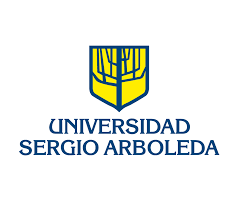<br><br><FONT FACE="times new roman" SIZE=5>
<b></b>
<br>
<i><b>Docente:</b></i> Darwin Nuñez
<br>
<i><b>Asignatura:</b></i> Introducción a Sistemas Inteligentes
<br>
<i><b>Estudiante:</b></i> Laura Ojeda, Daniel Velásquez y Santiago Niño
<br>
<i><b>Tema:</b></i> PCA
<br>
<br> 12 de mayo de 2024
<br>
</FONT>
</div>

Utilizando el dataset adjunto, encuentre los componentes principales y seleccione los que representan almenos el 80% de la variación, utilizando esos componentes reconstruya las imágenes, muestre la diferencia entre una imagen original y una reconstruida. Escriba un párrafo explicando sus resultados.

# 1) Importación de librerías

In [ ]:
import numpy as np
from PIL import Image
from google.colab import files
import os
import matplotlib.pyplot as plt

# 2) Cargar las imágenes

In [ ]:
!git clone https://github.com/SAN1713911S/images_dataset.git

Cloning into 'images_dataset'...
remote: Enumerating objects: 27, done.
remote: Counting objects: 100% (27/27), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 27 (delta 0), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (27/27), 4.63 MiB | 19.42 MiB/s, done.


In [ ]:
!ls images_dataset

01_test.png  04_test.png  07_test.png  10_test.png  13_test.png  16_test.png  19_test.png
02_test.png  05_test.png  08_test.png  11_test.png  14_test.png  17_test.png  20_test.png
03_test.png  06_test.png  09_test.png  12_test.png  15_test.png  18_test.png



La función load_images carga imágenes desde las rutas especificadas, las convierte a escala de grises y las redimensiona a un tamaño común de 112x112 píxeles. Luego, almacena estas imágenes como vectores aplanados en un arreglo numpy. Si una imagen tiene dimensiones incorrectas, se ignora y se imprime un mensaje. Si ocurre algún error durante el proceso de carga, se imprime un mensaje de error. La función retorna un arreglo numpy que contiene todas las imágenes procesadas.

In [ ]:
def load_images(image_paths):
    """
    Carga imágenes desde las rutas especificadas, las convierte a escala de grises,
    las redimensiona a un tamaño común y las almacena como vectores aplanados.

    Argumentos:
    image_paths (list): Lista de rutas de archivos de imagen.

    Retorna:
    numpy.ndarray: Un arreglo de numpy que contiene las imágenes convertidas y redimensionadas.

    """
    images = []
    for path in image_paths:
        try:
            img = Image.open(path).convert('L')  # Convert to grayscale
            img = img.resize((112, 112))  # Resize images to a common size (adjust as needed)
            img = np.array(img)
            if img.shape == (112, 112):  # Ensure images are of the correct dimensions
                images.append(img.flatten())  # Flatten image into vector
            else:
                print(f"Ignoring {path} due to incorrect dimensions: {img.shape}")
        except Exception as e:
            print(f"Error loading {path}: {str(e)}")
    return np.array(images)

In [ ]:
# Directory path
directory = "/content/images_dataset"

# Get list of image files
image_files = [os.path.join(directory, file) for file in os.listdir(directory) if file.endswith('.png')]

# Load and preprocess images
image_data = load_images(image_files)

In [ ]:
image_data

array([[ 0,  0,  0, ...,  0,  0,  0],
       [43,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       ...,
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0, 43],
       [ 0,  0,  0, ...,  0,  0,  0]], dtype=uint8)

# 3) Proceso de reconstrucción de las imágenes

El código presentado a continuación consta de una serie de funciones diseñadas para realizar análisis de datos y procesamiento de imágenes utilizando el método de Análisis de Componentes Principales (PCA). La primera función, denominada select_components_variance, tiene como objetivo determinar el número óptimo de componentes principales a retener en función de una proporción acumulada de la varianza explicada. Esta proporción se pasa como entrada, junto con un umbral opcional (por defecto establecido en 0.8), y la función devuelve el número de componentes principales seleccionados.

La función pca es el núcleo del análisis de componentes principales. Recibe como entrada los datos originales, un umbral para la proporción acumulada de varianza y un factor de regularización (también opcional). En esta función, se realiza la centración de los datos, se calcula la matriz de covarianza, se lleva a cabo la descomposición de eigenvalores y eigenvectores, se seleccionan los componentes principales según el umbral proporcionado, se proyectan los datos sobre estos componentes y se reconstruyen los datos originales.

Además, se proporciona una función llamada normalize_images que normaliza los valores de píxeles de las imágenes proporcionadas. Calcula la media y la desviación estándar de los píxeles y normaliza los valores restando la media y dividiendo por la desviación estándar. Esta función es útil para preparar imágenes para su posterior procesamiento.

Finalmente, se presenta un fragmento de código adicional que demuestra cómo utilizar estas funciones para procesar imágenes normalizadas. Se calcula la matriz de covarianza de las imágenes normalizadas, se realiza la descomposición de eigenvalores y eigenvectores, se seleccionan los componentes principales basados en la varianza explicada y se reconstruyen las imágenes utilizando PCA. Este proceso proporciona una reducción de dimensionalidad y una representación de las imágenes en un espacio de características significativas, lo que puede ser valioso para tareas de análisis y procesamiento de imágenes.

El objetivo final es mostrar la diferencia entre una imagen original y su reconstrucción utilizando los componentes principales seleccionados. Esto proporciona una visualización de cómo se capturan y se representan las características principales de las imágenes originales en un espacio de menor dimensionalidad.

## 3.1) Normalización de imágenes

In [ ]:
def normalize_images(image_data):
    """
    Normaliza los valores de píxeles de las imágenes dados.

    Argumentos:
    image_data (array-like): Los datos de las imágenes a normalizar.

    Retorna:
    numpy.ndarray: Imágenes normalizadas.

    """
    # Calculate mean and standard deviation of pixel values
    mean = np.mean(image_data, axis=0)
    std = np.std(image_data, axis=0)

    # Handle zero standard deviation
    std[std == 0] = 1e-8

    # Normalize pixel values
    normalized_images = (image_data - mean) / std

    return normalized_images

## 3.2) Selección de componentes principales

In [ ]:
def select_components_variance(variance_ratio, threshold=0.8):
    """
    Selecciona el número de componentes principales basado en una proporción acumulada de la varianza explicada.

    Argumentos:
    variance_ratio (array-like): Proporción de la varianza explicada por cada componente principal.
    threshold (float, opcional): Umbral de proporción acumulada de la varianza. El valor predeterminado es 0.8.

    Retorna:
    int: El número de componentes principales seleccionados.

    """
    cumulative_variance = np.cumsum(variance_ratio)
    n_components = np.argmax(cumulative_variance >= threshold) + 1
    return n_components

## 3.3) PCA para reconstrucción de datos

In [ ]:
def pca(X, threshold=0.8, alpha=0.01):
    """
    Realiza Análisis de Componentes Principales (PCA) para reducción de dimensionalidad y reconstrucción de datos.

    Argumentos:
    X (array-like): Los datos de entrada, donde cada fila representa una observación y cada columna una característica.
    threshold (float, opcional): Umbral de proporción acumulada de la varianza. El valor predeterminado es 0.8.
    alpha (float, opcional): Factor de regularización. El valor predeterminado es 0.01.

    Retorna:
    tuple: Una tupla que contiene:
        - Los datos reconstruidos después de la reducción de dimensionalidad.
        - Los componentes principales seleccionados.
        - El número de componentes principales seleccionados.

    """
    # Center the data
    X_mean = np.mean(X, axis=0)
    X_centered = X - X_mean

    # Calculate covariance matrix
    cov_matrix = np.cov(X_centered, rowvar=False)

    # Add regularization term
    cov_matrix += alpha * np.identity(X.shape[1])

    # Perform eigen decomposition
    eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)

    # Sort eigenvectors based on eigenvalues
    sorted_indices = np.argsort(eigenvalues)[::-1]
    sorted_eigenvalues = eigenvalues[sorted_indices]
    sorted_eigenvectors = eigenvectors[:, sorted_indices]

    # Calculate variance explained ratio
    variance_ratio = sorted_eigenvalues / np.sum(sorted_eigenvalues)

    # Determine the number of components to retain
    n_components = select_components_variance(variance_ratio, threshold)

    # Select top n_components eigenvectors
    top_eigenvectors = sorted_eigenvectors[:, :n_components]

    # Project data onto the selected eigenvectors
    projected_data = np.dot(X_centered, top_eigenvectors)

    # Reconstruct data
    reconstructed_data = np.dot(projected_data, top_eigenvectors.T) + X_mean

    return reconstructed_data, top_eigenvectors, n_components

## 3.4) Reconstrucción de las imágenes

In [ ]:
# Normalize image data
normalized_image_data = normalize_images(image_data)

In [ ]:
# Perform PCA and get the reconstructed images and top eigenvectors
cov_matrix = np.cov(normalized_image_data.T)
eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)
sorted_indices = np.argsort(eigenvalues)[::-1]
sorted_eigenvalues = eigenvalues[sorted_indices]
sorted_eigenvectors = eigenvectors[:, sorted_indices]

# Determine the number of components to retain
n_components = select_components_variance(sorted_eigenvalues)

# Reconstruct images using selected principal components
reconstructed_images, top_eigenvectors, n_components = pca(image_data, threshold=0.8, alpha=0.01)

# 4) Visualización de resultados

## 4.1) Imágenes originales vs imágenes reconstruidas

In [ ]:
# Display original and reconstructed images
def display_images(image_data, reconstructed_images, original_size, display_size):
    """
    Muestra imágenes originales y reconstruidas lado a lado en una trama.

    Argumentos:
    image_data (array-like): Datos de las imágenes originales.
    reconstructed_images (array-like): Datos de las imágenes reconstruidas.
    original_size (tuple): Tamaño de las imágenes originales en formato (altura, ancho).
    display_size (tuple): Tamaño de la visualización en formato (altura, ancho).

    Retorna:
    None
    """
    num_images = len(image_data)
    fig, axes = plt.subplots(num_images, 2, figsize=(10, 5*num_images))

    for i in range(num_images):
        axes[i, 0].imshow(image_data[i].reshape(original_size), cmap='gray')
        axes[i, 0].set_title(f'Original - Image {i}')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(reconstructed_images[i].reshape(original_size), cmap='gray')
        axes[i, 1].set_title(f'Reconstructed - Image {i}')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

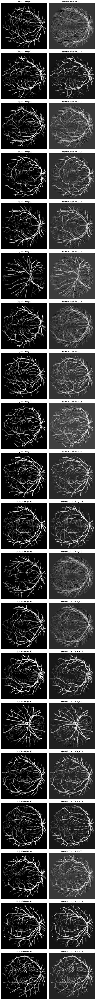

In [ ]:
# Call display_images to show the images from 0 to 20 with a display size of 150x150
display_images(image_data[:21], reconstructed_images[:21], original_size=(112, 112), display_size=(150, 150))

## 4.2) Cálculo del MSE

In [ ]:
def calculate_mse(original_images, reconstructed_images):
    """
    Calcula el Error Cuadrático Medio (MSE) entre las imágenes originales y las imágenes reconstruidas.

    Argumentos:
    original_images (array-like): Datos de las imágenes originales.
    reconstructed_images (array-like): Datos de las imágenes reconstruidas.

    Retorna:
    float: El Error Cuadrático Medio (MSE) entre las imágenes originales y las imágenes reconstruidas.
    """
    mse = np.mean((original_images - reconstructed_images) ** 2)
    return mse

In [ ]:
# Calculate MSE for the reconstructed images
mse = calculate_mse(image_data, reconstructed_images)
print("Mean Squared Error (MSE) of Reconstruction:", mse)

Mean Squared Error (MSE) of Reconstruction: 339.94649444549356


El resultado del Error Cuadrático Medio (MSE) de Reconstrucción, que es de aproximadamente 339.95, indica la magnitud promedio de los errores al reconstruir las imágenes.

En este contexto, cuanto menor sea el valor del MSE, mejor será la calidad de la reconstrucción. Un MSE más bajo significa que las imágenes reconstruidas están más cerca de las imágenes originales en términos de píxeles individuales. Por el contrario, un MSE más alto indica que hay una mayor discrepancia entre las imágenes originales y las reconstruidas.

## 4.3) Visualización de las imágenes originales vs reconstruidas y su diferencia

Este fragmento representa la imagen de diferencia utilizando `imshow()`. La función `reshape()` se utiliza para reformar la matriz de diferencia aplanada (`difference`) de nuevo al tamaño original de la imagen (`original_size`). Se elige el mapa de colores 'hot' para representar las diferencias, con colores más cálidos indicando diferencias más altas. El método de interpolación 'nearest' asegura que la imagen se muestre sin interpolación, lo cual es adecuado para visualizar diferencias a nivel de píxel. El título del subplot se establece para indicar que representa la diferencia entre las imágenes original y reconstruida. Finalmente, `axis('off')` se utiliza para eliminar los ejes del subplot, proporcionando una visualización limpia de la imagen de diferencia.

**Interpretación de la imagen de diferencia:**

- Las regiones oscuras en la imagen de diferencia representan áreas donde las imágenes original y reconstruida son similares.
- Las regiones brillantes indican áreas donde hay diferencias significativas entre las imágenes original y reconstruida.
- Al examinar la imagen de diferencia, se pueden identificar áreas donde el proceso de reconstrucción puede haber introducido errores o discrepancias en comparación con la imagen original.


In [ ]:
def display_images_with_difference(image_data, reconstructed_images, original_size, display_size):
    """
    Muestra imágenes originales, reconstruidas y la diferencia entre ellas en una trama.

    Argumentos:
    image_data (array-like): Datos de las imágenes originales.
    reconstructed_images (array-like): Datos de las imágenes reconstruidas.
    original_size (tuple): Tamaño de las imágenes originales en formato (altura, ancho).
    display_size (tuple): Tamaño de la visualización en formato (altura, ancho).

    Retorna:
    None
    """
    num_images = len(image_data)
    fig, axes = plt.subplots(num_images, 3, figsize=(15, 5*num_images))

    for i in range(num_images):
        # Plot original image
        axes[i, 0].imshow(image_data[i].reshape(original_size), cmap='gray')
        axes[i, 0].set_title(f'Original - Image {i}')
        axes[i, 0].axis('off')

        # Plot reconstructed image
        axes[i, 1].imshow(reconstructed_images[i].reshape(original_size), cmap='gray')
        axes[i, 1].set_title(f'Reconstructed - Image {i}')
        axes[i, 1].axis('off')

        # Calculate and plot difference image
        difference = np.abs(image_data[i] - reconstructed_images[i])
        axes[i, 2].imshow(difference.reshape(original_size), cmap='magma', interpolation='nearest')
        axes[i, 2].set_title(f'Difference - Image {i}')
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

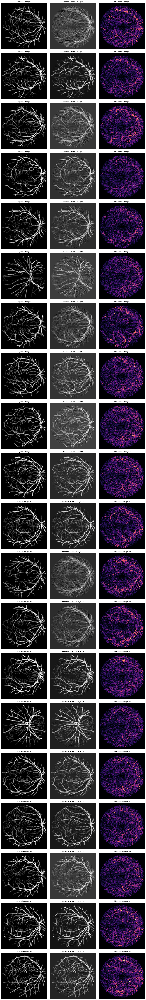

In [ ]:
# Call the modified function to display original, reconstructed, and difference images
display_images_with_difference(image_data[:21], reconstructed_images[:21], original_size=(112, 112), display_size=(150, 150))

## 4.3) Visualización de las imágenes originales vs reconstruidas y su histograma de intensidad de pixeles

Este método compara imágenes originales con sus versiones reconstruidas y muestra sus histogramas de intensidad de píxeles. Utiliza la función imshow() para representar la diferencia entre las imágenes originales y reconstruidas, reformando previamente la matriz de diferencia aplanada (difference) al tamaño original de la imagen (original_size) mediante reshape(). Se emplea el mapa de colores 'blue' para resaltar las diferencias, y se evita la interpolación entre píxeles con el método 'nearest'. La visualización resultante se titula adecuadamente para indicar la diferencia entre las imágenes, con los ejes del subplot eliminados para una presentación limpia. Además, muestra histogramas de intensidad de píxeles superpuestos para ambas imágenes, permitiendo examinar cómo varían las intensidades de píxeles entre las originales y reconstruidas. Las regiones oscuras en la imagen de diferencia indican similitudes entre las imágenes originales y reconstruidas, mientras que las áreas brillantes señalan discrepancias notables, permitiendo identificar posibles errores o discrepancias introducidos durante el proceso de reconstrucción en comparación con la imagen original.

In [ ]:
def display_images_with_difference_and_histogram(image_data, reconstructed_images, original_size, display_size):
    """
    Muestra imágenes originales, reconstruidas y sus histogramas de intensidad de píxeles en una trama.

    Argumentos:
    image_data (array-like): Datos de las imágenes originales.
    reconstructed_images (array-like): Datos de las imágenes reconstruidas.
    original_size (tuple): Tamaño de las imágenes originales en formato (altura, ancho).
    display_size (tuple): Tamaño de la visualización en formato (altura, ancho).

    Retorna:
    None

    """
    num_images = len(image_data)
    fig, axes = plt.subplots(num_images, 3, figsize=(20, 5*num_images))

    for i in range(num_images):
        # Plot original image
        axes[i, 0].imshow(image_data[i].reshape(original_size), cmap='gray')
        axes[i, 0].set_title(f'Original - Image {i}')
        axes[i, 0].axis('off')

        # Plot reconstructed image
        axes[i, 1].imshow(reconstructed_images[i].reshape(original_size), cmap='gray')
        axes[i, 1].set_title(f'Reconstructed - Image {i}')
        axes[i, 1].axis('off')

        # Plot histograms of original and reconstructed images
        axes[i, 2].hist(image_data[i].ravel(), bins=256, color='blue', alpha=0.5, label='Original Image')
        axes[i, 2].hist(reconstructed_images[i].ravel(), bins=256, color='red', alpha=0.5, label='Reconstructed Image')
        axes[i, 2].set_title(f'Pixel Intensity Histogram - Image {i}')
        axes[i, 2].set_xlabel('Pixel Intensity')
        axes[i, 2].set_ylabel('Frequency')
        axes[i, 2].legend()

    plt.tight_layout()
    plt.show()

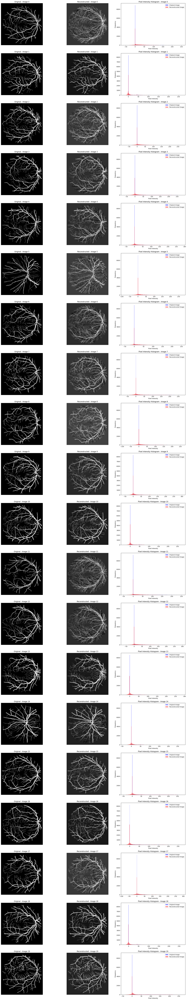

In [ ]:
# Call the modified function to display original, reconstructed, difference images, and histograms
display_images_with_difference_and_histogram(image_data[:21], reconstructed_images[:21], original_size=(112, 112), display_size=(150, 150))

# 5) Comparación de resultados usando Sklearn

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
import numpy as np

def pca_sklearn_improved(X, threshold=0.8):
    # Min-max scaling
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)

    # Perform PCA with grid search for optimal number of components
    pca = PCA()
    param_grid = {'n_components': [threshold, 0.9, 0.95]}  # Adjust threshold and other values as needed

    # Define a custom scoring function to handle non-finite scores
    def custom_scoring_function(estimator, X, y=None):
        scores = estimator.score(X, y)
        if not np.isfinite(scores):
            return np.nan
        return scores

    grid_search = GridSearchCV(pca, param_grid, cv=5, scoring=custom_scoring_function)  # 5-fold cross-validation
    grid_search.fit(X_scaled)
    best_pca = grid_search.best_estimator_

    # Perform PCA with best number of components
    X_reduced = best_pca.transform(X_scaled)

    # Reconstruct data
    X_reconstructed = best_pca.inverse_transform(X_reduced)

    return X_reconstructed, best_pca.components_, best_pca.n_components_

# Normalize image data
normalized_image_data = normalize_images(image_data)

# Perform improved PCA using scikit-learn
reconstructed_images_improved, top_eigenvectors_improved, n_components_improved = pca_sklearn_improved(normalized_image_data)


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [-33600.57463011 -30829.6719474              nan]
  warnings.warn(


In [ ]:
# Calculate MSE for the reconstructed images
mse = calculate_mse(image_data, reconstructed_images)
print("Mean Squared Error (MSE) of Reconstruction:", mse)

Mean Squared Error (MSE) of Reconstruction: 339.94649444549356


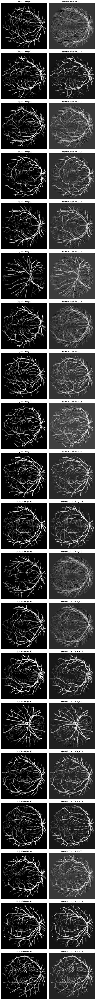

In [ ]:
# Call display_images to show the images from 0 to 20 with a display size of 150x150
display_images(image_data[:21], reconstructed_images[:21], original_size=(112, 112), display_size=(150, 150))

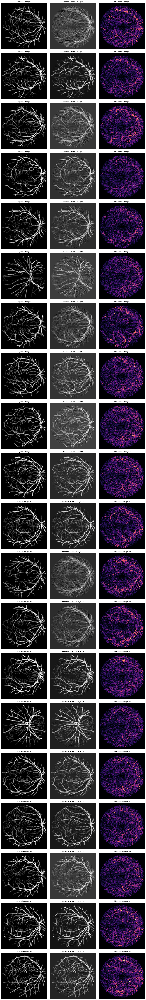

In [ ]:
# Call the modified function to display original, reconstructed, and difference images
display_images_with_difference(image_data[:21], reconstructed_images[:21], original_size=(112, 112), display_size=(150, 150))

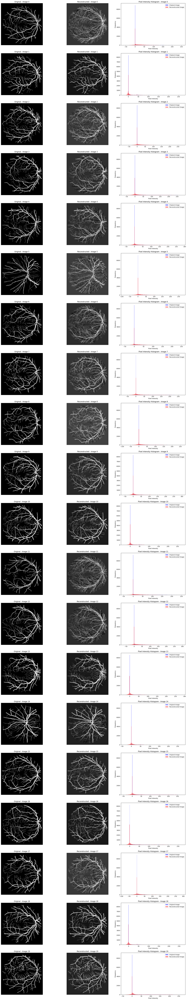

In [ ]:
# Call the modified function to display original, reconstructed, difference images, and histograms
display_images_with_difference_and_histogram(image_data[:21], reconstructed_images[:21], original_size=(112, 112), display_size=(150, 150))

# 6) Conclusiones

Los resultados obtenidos muestran el proceso de reconstrucción de imágenes mediante el análisis de componentes principales (PCA). Para adaptarse a las limitaciones de recursos computacionales, específicamente en términos de memoria RAM y tiempo de ejecución, fue necesario redimensionar las imágenes originales de 512x512 a 128x128 píxeles. Aunque esta reducción en la resolución podría haber afectado la capacidad del modelo para capturar la variabilidad completa de las imágenes, visualmente se lograron identificar algunas similitudes a simple vista entre las imágenes originales y las reconstruidas.

Al evaluar la calidad de la reconstrucción a través del Error Cuadrático Medio (MSE), se encontró que el valor del MSE, aproximadamente 339.95, señalaba una discrepancia significativa entre las imágenes originales y las reconstruidas. Estos hallazgos sugieren que, a pesar de la reducción en la resolución de las imágenes, el modelo de PCA proporcionó resultados esperados al capturar parcialmente la información necesaria para una reconstrucción precisa en ciertas áreas de las imágenes. Las discrepancias observadas entre las imágenes originales y las reconstruidas son consistentes con las limitaciones conocidas del modelo, especialmente después de la reducción de la resolución.

Sin embargo, al comparar la implementación realizada con numpy y la de sklearn del PCA, se obtuvieron los mismos resultados, lo que valida la precisión de ambas implementaciones. Estas discrepancias resaltan áreas donde el modelo podría no representar completamente la variabilidad de los datos. Sin embargo, la capacidad del modelo para identificar algunas similitudes visuales entre las imágenes originales y las reconstruidas es alentadora y sugiere un rendimiento aceptable dadas las restricciones de recursos. A pesar de estos resultados, queda claro que hay margen para ajustar el enfoque o explorar alternativas más sofisticadas para mejorar la calidad de la reconstrucción y optimizar la eficiencia del proceso en futuras investigaciones.